

---
<p align="left">
  <big>
    <b>
      <pre>
Camila Manara Ribeiro                - RA: 769809 
Júlia Aparecida Sousa de Oliveira    - RA: 769707 
Luciana Oliveira de Souza Gomes      - RA: 769708 
Rafael Vinicius Polato Passador      - RA: 790036 
      </pre>
      <br>
      Disciplina: Aprendizado de Máquina
      <br>
      Professor: Prof. Dr. Diego Furtado Silva
      <br>
    </b>
  </big>
</p>


---

<h1 align="center"><b><big>Projeto de Implementação 01- Classificação de nomes por gênero</big></b></h1>




#**Introdução**

<br>

Neste documento será apresentado o código utilizado para implementação do trabalho proposto: um problema representado por dados estruturados e que possa ser resolvido com algoritmos de AM supervisionado vistos em aula

Dessa forma, para realização desta tarefa, escolheu-se um conjunto de nomes rotuládos como masculinos e femininos que serviu como dataset para classificação de gênero, utilizando, para isso, diversas features que serão abordadas durante o código. 

Assim sendo, serão apresentados os códigos utilizados, bem como as descrições das criações destes. Ademais, apresentam-se, também, as interpretações e documentações da problemática.

Link para a apresentação: 

# IMPORT



In [20]:
#Imports de bibliotecas necessárias que foram utilizadas durante a execução do código

In [21]:
import pandas as pd
import numpy as np


In [22]:
import matplotlib.pyplot as plt

In [23]:
import random
import nltk


In [24]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import f1_score, accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score, accuracy_score



# CARREGAR O DATASET


Carregamento do dataset com plot gráfico evidenciando o desbalanceamento entre classes

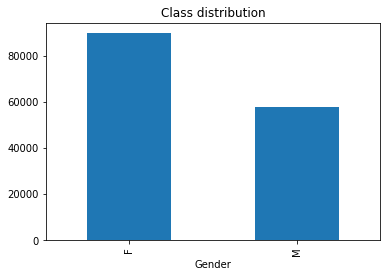

In [25]:
dataset = pd.read_csv('name_gender_dataset.csv')

dataset.pivot_table(index='Gender', aggfunc='size').plot(kind='bar', title = 'Class distribution')


# RANDOM OVERSAMPLING


Como se tratava de um dataset com dados desbalanceados, admitiu-se uma estratégia para contornar esse possível entrave que possibilitaria uma classificação tendenciosa, uma vez que, o número de nomes considerados "femininos" era consideravelmente superior aos masculinos.

Nesse contexto, utiliza-mos uma função de Random OverSampling, em que, aleatoriamente, duplica-se exemplos da classe minoritária (nomes masculinos)

In [26]:
def oversampler(dataset):
    classes = dataset.Gender.value_counts().to_dict() #converte o dataset em um dicionario
    maior = max(classes.values()) #recebe os maiores valores
    classes_lista = []
    for key in classes:
        classes_lista.append(dataset[dataset['Gender'] == key]) 
    classes_exemplo = []
    for i in range(1,len(classes_lista)):
        classes_exemplo.append(classes_lista[i].sample(maior, replace=True)) #oversample
    dataset_prov = pd.concat(classes_exemplo)
    final_dataset = pd.concat([dataset_prov,classes_lista[0]], axis=0)
    final_dataset = final_dataset.reset_index(drop=True)
    return final_dataset

In [27]:
dataset = oversampler(dataset)

In [28]:
print(dataset)

            Name Gender  Count   Probability
0        Bristin      M      6  1.642040e-08
1          Cohyn      M     18  4.926130e-08
2        Deandre      M  28723  7.860740e-05
3        Jariyah      M     20  5.473480e-08
4          Xinze      M      1  2.736740e-09
...          ...    ...    ...           ...
179493     Zyika      F      1  2.736740e-09
179494  Zymeliah      F      1  2.736740e-09
179495    Zyrije      F      1  2.736740e-09
179496   Zyrinah      F      1  2.736740e-09
179497      Zyta      F      1  2.736740e-09

[179498 rows x 4 columns]


In [29]:
dataset.head()

,Name,Gender,Count,Probability
0,Bristin,M,6,1.642040e-08
1,Cohyn,M,18,4.926130e-08
2,Deandre,M,28723,7.860740e-05
3,Jariyah,M,20,5.473480e-08
4,Xinze,M,1,2.736740e-09


In [30]:
dataset.dtypes

Name            object
Gender          object
Count            int64
Probability    float64
dtype: object

In [31]:
M_data = dataset[dataset.Gender == 'M']
F_data = dataset[dataset.Gender == 'F']

In [32]:
print(M_data)
print(F_data)

              Name Gender  Count   Probability
0          Bristin      M      6  1.642040e-08
1            Cohyn      M     18  4.926130e-08
2          Deandre      M  28723  7.860740e-05
3          Jariyah      M     20  5.473480e-08
4            Xinze      M      1  2.736740e-09
...            ...    ...    ...           ...
89744       Ephram      M    389  1.064590e-06
89745       Srecko      M      1  2.736740e-09
89746       Lipman      M      6  1.642040e-08
89747     Donnovin      M      8  2.189390e-08
89748  Ty-Jonathon      M      1  2.736740e-09

[89749 rows x 4 columns]
             Name Gender    Count   Probability
89749        Mary      F  4169663  1.141129e-02
89750   Elizabeth      F  1704140  4.663789e-03
89751    Patricia      F  1608260  4.401391e-03
89752    Jennifer      F  1584426  4.336163e-03
89753       Linda      F  1480592  4.051996e-03
...           ...    ...      ...           ...
179493      Zyika      F        1  2.736740e-09
179494   Zymeliah      F  

In [33]:
M_nomes = M_data[M_data.columns[0]].tolist()
F_nomes = F_data[F_data.columns[0]].tolist()

Como podemos observar, a distribuição de dados entre as classes está, agora, balanceada

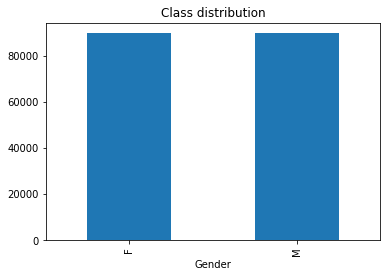

In [34]:
dataset.pivot_table(index='Gender', aggfunc='size').plot(kind='bar', title = 'Class distribution')


# TREINAMENTO TF-IDF


Nessa seção, apresentaremos o código do treinamento realizado a partir do valor de TF-IDF como feature.
O Tf–idf é uma medida estatística que tem o intuito de indicar a importância de uma palavra de um documento em relação ao dataset, ou seja, calcula-se um valor baseado na sua incidência e admite isso como feature. 

Como classificador, utilizou-se o Naive Bayes.


In [35]:
#Transformando os rótulos 'F' e 'M'
dataset_binario = dataset

dataset_binario.Gender.replace({'F':0,'M':1},inplace=True)

dataset_binario.Gender.unique()


array([1, 0])

In [36]:
#Vetorizando todos os nomes e extraindo seu valor de TF-IDF como feature, futuramente utilizada pelo Naive Bayes
Xfeatures = dataset_binario['Name']
convertor = TfidfVectorizer()

#Features
X = convertor.fit_transform(Xfeatures)
convertor.get_feature_names()
#Rotulos
y = dataset_binario.Gender


In [37]:
#Separando os dados entre treinamento e teste
X_treino, X_teste, y_treino, y_teste = train_test_split(X, y)

#Classificando o dataset a partir das features com o Naive Bayes
classifier = MultinomialNB()
classifier.fit(X_treino,y_treino)
classifier.score(X_teste,y_teste)


0.5060278551532034

In [38]:
final_results = classifier.predict(X_teste)
print(final_results)

[1 1 1 ... 1 1 1]


In [39]:
#Calculando acurácia da amostra
print("Accuracy of Model",classifier.score(X_teste,y_teste)*100,"%")

Accuracy of Model 50.602785515320335 %


In [40]:
print("Accuracy of Model",classifier.score(X_treino,y_treino)*100,"%")


Accuracy of Model 94.35534789746181 %


In [41]:
print(y_teste)
print(final_results)

39492     1
7688      1
84626     1
84412     1
150600    0
         ..
23355     1
137265    0
141552    0
85023     1
27169     1
Name: Gender, Length: 44875, dtype: int64
[1 1 1 ... 1 1 1]


In [42]:
#Calculando o F1-Score da amotstra
print("F1: ", f1_score(y_teste, final_results))

F1:  0.6543912440169009


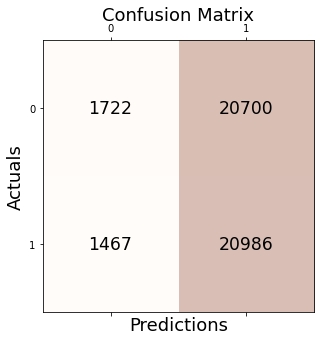

In [43]:
conf_matrix = confusion_matrix(y_true=y_teste, y_pred=final_results)
#
# Print the confusion matrix using Matplotlib
#
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

# TREINAMENTO COM EXTRAÇÕES DE LETRAS 

Nessa seção, apresentaremos o código do treinamento realizado a partir da extração de features gramaticais.
Realizamos a testagem considerando sufixos, prefixos e a combinação de ambos para averiguar qual configuração apresentava melhores resultados e, posteriormente, evidencia-se as features mais relevantes

Como classificador, tambéum utilizou-se o Naive Bayes.

In [44]:
#feature considerando o sufixo
def feature_sufixo(x):
    return {'sufixo1': x[-1:],
            'sufixo2': x[-2:],
            }
feature_sufixo('Josephine')

{'sufixo1': 'e', 'sufixo2': 'ne'}

In [45]:
#feature combinando prefixo e sufixo
def feature_prefixosufixo(x):
    return {'sufixo1': x[-1:],
            'sufixo2': x[-2:],
            'prefixo': x[:2],
            }
feature_prefixosufixo('Josephine')

{'prefixo': 'Jo', 'sufixo1': 'e', 'sufixo2': 'ne'}

In [46]:
#feature considerando o prefixo
def feature_prefixo(x):
    return {
            'prefixo': x[0],
            'prefixo2': x[:2],
            }
feature_prefixo('Josephine')

{'prefixo': 'J', 'prefixo2': 'Jo'}

In [47]:
final_dataset = dataset.iloc[:,[0,1]]


In [48]:
dataset_features = final_dataset

print(dataset_features)

            Name  Gender
0        Bristin       1
1          Cohyn       1
2        Deandre       1
3        Jariyah       1
4          Xinze       1
...          ...     ...
179493     Zyika       0
179494  Zymeliah       0
179495    Zyrije       0
179496   Zyrinah       0
179497      Zyta       0

[179498 rows x 2 columns]


In [49]:
M_data2 = dataset_features[dataset_features.Gender == 1]
F_data2 = dataset_features[dataset_features.Gender == 0]


M_nomes2 = M_data2[M_data2.columns[0]].tolist()
F_nomes2 = F_data2[F_data2.columns[0]].tolist()


##Treinamento utilizando o prefixo dos nomes como features para o classificador

In [50]:
#Treinamento com as features sendo PREFIXO (rodar somente 1 dos blocos)


nomes_rotulados = ([(Name, 1) for Name in M_nomes2] + [(Name, 0) for Name in F_nomes2])
print(nomes_rotulados)
#random.shuffle(nomes_rotulados)

set_features = [(feature_prefixo(n), Gender) for (n, Gender) in nomes_rotulados]
set_treino, set_teste = set_features[50000:], set_features[:50000]
classifier = nltk.NaiveBayesClassifier.train(set_treino)


[('Bristin', 1), ('Cohyn', 1), ('Deandre', 1), ('Jariyah', 1), ('Xinze', 1), ('Ziatko', 1), ('Victorio', 1), ('Kywan', 1), ('Todderick', 1), ('Dimitrius', 1), ('Nicol', 1), ('Halford', 1), ('Tohir', 1), ('Haget', 1), ('Andreina', 1), ('Kwang', 1), ('Anothony', 1), ('Abdulhamied', 1), ('Farouq', 1), ('Doney', 1), ('Till', 1), ('Bashawn', 1), ('Dekendrick', 1), ('Jeaden', 1), ('Luthais', 1), ('Westleigh', 1), ('Marchello', 1), ('Anthnoy', 1), ('Arshpreet', 1), ('Henryk-Jan', 1), ('Ordean', 1), ('Calyx', 1), ('Alphons', 1), ('Uwais', 1), ('Darrean', 1), ('Melissa', 1), ('Krittipong', 1), ('Skippy', 1), ('Coogan', 1), ('Ifeanyi', 1), ('Nox', 1), ('Bhawani', 1), ('Haamid', 1), ('Satyender', 1), ('Jashone', 1), ('Montonio', 1), ('Wesam', 1), ('Eddy-Darcy', 1), ('Mccall', 1), ('Flem', 1), ('Satori', 1), ('Rhylan', 1), ('Serafin', 1), ('Milane', 1), ('Gleason', 1), ('Amiin', 1), ('Lowan', 1), ('Andis', 1), ('Ched', 1), ('Harlowe', 1), ('Argus', 1), ('Levid', 1), ('Yang', 1), ('Kycenn', 1), ('V

In [51]:
print(nltk.classify.accuracy(classifier, set_teste))

0.11142


In [52]:
classifier.show_most_informative_features(15)


Most Informative Features
                prefixo2 = 'Wl'                1 : 0      =     11.2 : 1.0
                prefixo2 = 'Bj'                1 : 0      =      8.5 : 1.0
                prefixo2 = 'Vl'                1 : 0      =      6.7 : 1.0
                prefixo2 = 'Jw'                1 : 0      =      6.7 : 1.0
                prefixo2 = 'Wo'                1 : 0      =      6.5 : 1.0
                prefixo2 = 'Oj'                1 : 0      =      6.1 : 1.0
                prefixo2 = 'Dn'                0 : 1      =      6.1 : 1.0
                prefixo2 = 'Ob'                1 : 0      =      5.9 : 1.0
                prefixo2 = 'Ic'                0 : 1      =      5.6 : 1.0
                prefixo2 = 'Ax'                1 : 0      =      5.5 : 1.0
                prefixo2 = 'Dk'                1 : 0      =      5.5 : 1.0
                prefixo2 = 'Jc'                1 : 0      =      5.2 : 1.0
                prefixo2 = 'Md'                1 : 0      =      5.2 : 1.0

In [53]:
#Treinamento com as features sendo PREFIXO (rodar somente 1 dos blocos)

vetor = []
for (name, tag) in nomes_rotulados:
  guess = classifier.classify(feature_prefixo(name))
  vetor.append(guess)
print(vetor)


[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 

In [54]:
enumerate(vetor)
for i, item in enumerate(vetor):
    if item == 'F':
        vetor[i] = 0
    elif item == 'M':
        vetor[i] = 1

print(vetor)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 

In [55]:
lista_generos = [Gender for (n, Gender) in nomes_rotulados]
print(lista_generos)

enumerate(lista_generos)
for i, item in enumerate(lista_generos):
    if item == 'F':
        lista_generos[i] = 0
    elif item == 'M':
        lista_generos[i] = 1

print(lista_generos)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [56]:
print("F1: ", f1_score(lista_generos, vetor))

F1:  0.194191029425769


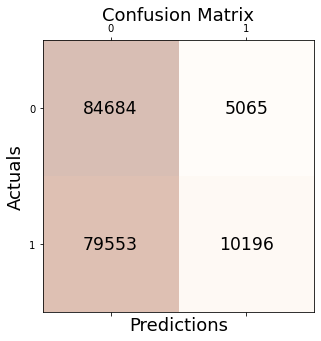

In [57]:
conf_matrix = confusion_matrix(y_true=lista_generos, y_pred=vetor)
#
# Print the confusion matrix using Matplotlib
#
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

##Treinamento utilizando a combinação prefixo e sufixo dos nomes como features para o classificador

In [58]:
#Treinamento com as features sendo PREFIXO+SUFIXO

nomes_rotulados = ([(Name, 1) for Name in M_nomes2] + [(Name, 0) for Name in F_nomes2])
print(nomes_rotulados)
#random.shuffle(nomes_rotulados)

set_features = [(feature_prefixosufixo(n), Gender) for (n, Gender) in nomes_rotulados]
set_treino, set_teste = set_features[50000:], set_features[:50000]
classifier = nltk.NaiveBayesClassifier.train(set_treino)

[('Bristin', 1), ('Cohyn', 1), ('Deandre', 1), ('Jariyah', 1), ('Xinze', 1), ('Ziatko', 1), ('Victorio', 1), ('Kywan', 1), ('Todderick', 1), ('Dimitrius', 1), ('Nicol', 1), ('Halford', 1), ('Tohir', 1), ('Haget', 1), ('Andreina', 1), ('Kwang', 1), ('Anothony', 1), ('Abdulhamied', 1), ('Farouq', 1), ('Doney', 1), ('Till', 1), ('Bashawn', 1), ('Dekendrick', 1), ('Jeaden', 1), ('Luthais', 1), ('Westleigh', 1), ('Marchello', 1), ('Anthnoy', 1), ('Arshpreet', 1), ('Henryk-Jan', 1), ('Ordean', 1), ('Calyx', 1), ('Alphons', 1), ('Uwais', 1), ('Darrean', 1), ('Melissa', 1), ('Krittipong', 1), ('Skippy', 1), ('Coogan', 1), ('Ifeanyi', 1), ('Nox', 1), ('Bhawani', 1), ('Haamid', 1), ('Satyender', 1), ('Jashone', 1), ('Montonio', 1), ('Wesam', 1), ('Eddy-Darcy', 1), ('Mccall', 1), ('Flem', 1), ('Satori', 1), ('Rhylan', 1), ('Serafin', 1), ('Milane', 1), ('Gleason', 1), ('Amiin', 1), ('Lowan', 1), ('Andis', 1), ('Ched', 1), ('Harlowe', 1), ('Argus', 1), ('Levid', 1), ('Yang', 1), ('Kycenn', 1), ('V

In [59]:
print(nltk.classify.accuracy(classifier, set_teste))

0.69332


In [60]:
classifier.show_most_informative_features(15)


Most Informative Features
                 sufixo2 = 'os'                1 : 0      =     34.7 : 1.0
                 sufixo2 = 'ob'                1 : 0      =     26.6 : 1.0
                 sufixo2 = 'yk'                1 : 0      =     22.9 : 1.0
                 sufixo2 = 'jr'                1 : 0      =     21.7 : 1.0
                 sufixo2 = 'ib'                1 : 0      =     21.0 : 1.0
                 sufixo2 = 'io'                1 : 0      =     20.7 : 1.0
                 sufixo2 = 'pp'                1 : 0      =     20.2 : 1.0
                 sufixo2 = 'ck'                1 : 0      =     17.1 : 1.0
                 sufixo2 = 'ik'                1 : 0      =     17.0 : 1.0
                 sufixo2 = 'av'                1 : 0      =     16.6 : 1.0
                 sufixo2 = 'rd'                1 : 0      =     15.7 : 1.0
                 sufixo2 = 'nk'                1 : 0      =     15.2 : 1.0
                 sufixo2 = 'eq'                1 : 0      =     14.2 : 1.0

In [61]:
#Treinamento com as features sendo PREFIXO+SUFIXO

vetor = []
for (name, tag) in nomes_rotulados:
  guess = classifier.classify(feature_prefixosufixo(name))
  vetor.append(guess)
print(vetor)

[1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 

In [62]:
enumerate(vetor)
for i, item in enumerate(vetor):
    if item == 'F':
        vetor[i] = 0
    elif item == 'M':
        vetor[i] = 1

print(vetor)

[1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 

In [63]:
lista_generos = [Gender for (n, Gender) in nomes_rotulados]
print(lista_generos)

enumerate(lista_generos)
for i, item in enumerate(lista_generos):
    if item == 'F':
        lista_generos[i] = 0
    elif item == 'M':
        lista_generos[i] = 1

print(lista_generos)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [64]:
print("F1: ", f1_score(lista_generos, vetor))

F1:  0.7415682139090957


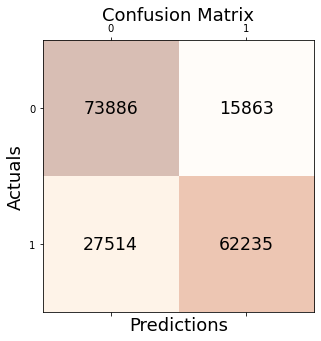

In [65]:
conf_matrix = confusion_matrix(y_true=lista_generos, y_pred=vetor)
#
# Print the confusion matrix using Matplotlib
#
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

##Treinamento utilizando o sufixo dos nomes como features para o classificador

In [66]:
#Treinamento com as features sendo SUFIXO


nomes_rotulados = ([(Name, 1) for Name in M_nomes2] + [(Name, 0) for Name in F_nomes2])
print(nomes_rotulados)
#random.shuffle(nomes_rotulados)

set_features = [(feature_sufixo(n), Gender) for (n, Gender) in nomes_rotulados]
set_treino, set_teste = set_features[50000:], set_features[:50000]
classifier = nltk.NaiveBayesClassifier.train(set_treino)

[('Bristin', 1), ('Cohyn', 1), ('Deandre', 1), ('Jariyah', 1), ('Xinze', 1), ('Ziatko', 1), ('Victorio', 1), ('Kywan', 1), ('Todderick', 1), ('Dimitrius', 1), ('Nicol', 1), ('Halford', 1), ('Tohir', 1), ('Haget', 1), ('Andreina', 1), ('Kwang', 1), ('Anothony', 1), ('Abdulhamied', 1), ('Farouq', 1), ('Doney', 1), ('Till', 1), ('Bashawn', 1), ('Dekendrick', 1), ('Jeaden', 1), ('Luthais', 1), ('Westleigh', 1), ('Marchello', 1), ('Anthnoy', 1), ('Arshpreet', 1), ('Henryk-Jan', 1), ('Ordean', 1), ('Calyx', 1), ('Alphons', 1), ('Uwais', 1), ('Darrean', 1), ('Melissa', 1), ('Krittipong', 1), ('Skippy', 1), ('Coogan', 1), ('Ifeanyi', 1), ('Nox', 1), ('Bhawani', 1), ('Haamid', 1), ('Satyender', 1), ('Jashone', 1), ('Montonio', 1), ('Wesam', 1), ('Eddy-Darcy', 1), ('Mccall', 1), ('Flem', 1), ('Satori', 1), ('Rhylan', 1), ('Serafin', 1), ('Milane', 1), ('Gleason', 1), ('Amiin', 1), ('Lowan', 1), ('Andis', 1), ('Ched', 1), ('Harlowe', 1), ('Argus', 1), ('Levid', 1), ('Yang', 1), ('Kycenn', 1), ('V

In [67]:
print(nltk.classify.accuracy(classifier, set_teste))

0.68358


In [68]:
classifier.show_most_informative_features(15)


Most Informative Features
                 sufixo2 = 'os'                1 : 0      =     34.7 : 1.0
                 sufixo2 = 'ob'                1 : 0      =     26.6 : 1.0
                 sufixo2 = 'yk'                1 : 0      =     22.9 : 1.0
                 sufixo2 = 'jr'                1 : 0      =     21.7 : 1.0
                 sufixo2 = 'ib'                1 : 0      =     21.0 : 1.0
                 sufixo2 = 'io'                1 : 0      =     20.7 : 1.0
                 sufixo2 = 'pp'                1 : 0      =     20.2 : 1.0
                 sufixo2 = 'ck'                1 : 0      =     17.1 : 1.0
                 sufixo2 = 'ik'                1 : 0      =     17.0 : 1.0
                 sufixo2 = 'av'                1 : 0      =     16.6 : 1.0
                 sufixo2 = 'rd'                1 : 0      =     15.7 : 1.0
                 sufixo2 = 'nk'                1 : 0      =     15.2 : 1.0
                 sufixo2 = 'eq'                1 : 0      =     14.2 : 1.0

In [69]:
#Treinamento com as features sendo SUFIXO

vetor = []
for (name, tag) in nomes_rotulados:
  guess = classifier.classify(feature_sufixo(name))
  vetor.append(guess)
print(vetor)

[1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 

In [70]:
enumerate(vetor)
for i, item in enumerate(vetor):
    if item == 'F':
        vetor[i] = 0
    elif item == 'M':
        vetor[i] = 1

print(vetor)

[1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 

In [71]:
lista_generos = [Gender for (n, Gender) in nomes_rotulados]
print(lista_generos)

enumerate(lista_generos)
for i, item in enumerate(lista_generos):
    if item == 'F':
        lista_generos[i] = 0
    elif item == 'M':
        lista_generos[i] = 1

print(lista_generos)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [72]:
print("F1: ", f1_score(lista_generos, vetor))

F1:  0.7352620414424563


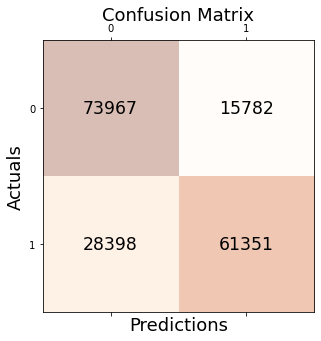

In [73]:
conf_matrix = confusion_matrix(y_true=lista_generos, y_pred=vetor)
#
# Print the confusion matrix using Matplotlib
#
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()